# Plotagem - "Ploting"

Prof. Daniel de Abreu Pereira Uhr

### Conteúdo

* Introdução
* Certifique-se de ter as bibliotecas necessárias instaladas
* Importando os Dados
* Limpeza e Preparação dos Dados


### Referências

* [Introduction to Statistical Learning](https://www.statlearning.com/) by Gareth James, Daniela Witten, Trevor Hastie and Robert Tibshirani 
* [Python Data Science Handbook](https://jakevdp.github.io/PythonDataScienceHandbook/) by Jake VanderPlas
* [Python (Documentação Oficial)](https://docs.python.org/3/)
* [NumPy (Array e Computação Numérica)](https://numpy.org/doc/stable/)
* [Pandas (Manipulação e Análise de Dados)](https://pandas.pydata.org/docs/)
* [Matplotlib (Visualização de Dados)](https://matplotlib.org/contents.html)
* [Seaborn (Visualização de Dados)](https://seaborn.pydata.org/)
* [Geopandas (Visualização de Dados Geográficos)](https://geopandas.org/)
* [Contextily (Visualização de Dados Geográficos)](https://contextily.readthedocs.io/en/latest/)
* [Folium (Visualização de Dados Geográficos)](https://python-visualization.github.io/folium/)



### Introdução

Neste notebook, vamos explorar a plotagem de dados. A plotagem é uma parte essencial da análise de dados, pois permite visualizar padrões e tendências nos dados. Existem várias bibliotecas de plotagem disponíveis em Python, como Matplotlib, Seaborn e Plotly, que facilitam a criação de gráficos de alta qualidade.

### Certifique-se de ter as bibliotecas necessárias instaladas

Você pode instalá-las usando o pip:

```python	
pip install numpy pandas matplotlib seaborn folium geopandas contextily
```	


### Importando os dados

Nós usaremos dados Scraped do AirBnb para a cidade de Bolonha. Os dados estão disponíveis gratuitamente em Inside AirBnb : http://insideairbnb.com/get-the-data.html .

Usaremos 2 conjuntos de dados:

* conjunto de dados de listagem: contém informações de nível de listagem
* conjunto de dados de preços: contém dados de preços ao longo do tempo

In [63]:
import numpy as np
import pandas as pd
import folium
import geopandas
import contextily
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

Repare que temos novas bibliotecas que serão utilizadas:

* folium: para plotagem de mapas interativos
* geopandas: para plotagem de dados geográficos
* contextily: para adicionar mapas de fundo a gráficos geográficos
* matplotlib: para plotagem de gráficos
* seaborn: para plotagem de gráficos

In [64]:
# Import listings data
url_listings = "http://data.insideairbnb.com/italy/emilia-romagna/bologna/2021-12-17/data/listings.csv.gz"
df_listings = pd.read_csv(url_listings)

# Import calendar data
url_calendar = "http://data.insideairbnb.com/italy/emilia-romagna/bologna/2021-12-17/data/calendar.csv.gz"
df_prices = pd.read_csv(url_calendar, compression="gzip")

### Limpeza e Preparação dos Dados

In [65]:
# Limpeza e preparação dos dados
# Aqui nós vamos pegar a df_prices de uma string formatada como valor monetário para um número do tipo float
df_prices['price'] = df_prices['price'].str.replace('[$|,]', '', regex=True).astype(float)

Repare que estamos fazendo algumas operações de limpeza e preparação dos dados:

1. `df_prices['price'].str.replace('[$|,]', '', regex=True)`
* `str.replace('[$|,]', '', regex=True)` → Remove símbolos de dólar ($) e vírgulas (,) da string.
* Explicação do regex `[$|,]`:
  * [ e ] → Define um conjunto de caracteres a serem substituídos.
  * $ → Representa o símbolo de dólar.
  * , → Representa a vírgula usada em separação de milhares.
  * | dentro do conjunto [$|,] não é necessário, pois dentro de colchetes ([]), cada caractere é tratado separadamente.
2. .astype(float)
   * Converte os valores da coluna de string para tipo float.

Isso permite operações matemáticas como soma, média, gráficos etc.


In [66]:
# Convertendo a coluna 'date' para o formato de data (datetime) no Pandas
df_prices['date'] = pd.to_datetime(df_prices['date'], format='%Y-%m-%d')

* `df_prices['date']` → Seleciona a coluna 'date' do DataFrame.
* `pd.to_datetime(df_prices['date'], format='%Y-%m-%d')` → Converte os valores da coluna para o tipo datetime, garantindo que estejam no formato correto (YYYY-MM-DD).

In [67]:
# Convertendo a coluna 'available' em valores booleanos (True ou False), verificando se o valor da célula é 'f' (false no contexto dos dados do Airbnb).
df_prices['available'] = df_prices['available']=='f'

* `df_prices['available']` → Seleciona a coluna 'available' do DataFrame.
* `df_prices['available'] == 'f'` → Verifica se cada valor da coluna é igual a 'f' (False no banco de dados).
* Atribuição do resultado → Os valores True/False substituem os valores originais da coluna.

Avançando para o outro dataframe:

In [68]:
# Cleaning listings data
df_listings['price'] = df_listings['price'].str.replace('[$|,]', '', regex=True).astype(float)
df_listings = df_listings[['id', 'name', 'neighbourhood_cleansed', 'latitude', 'longitude', 'price',
                               'host_id', 'host_name', 'host_response_time', 'host_response_rate', 'host_acceptance_rate',
                               'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'amenities',
                               'number_of_reviews', 'reviews_per_month', 'first_review', 'last_review', 'review_scores_rating']]


renomeando colunas:

In [69]:
df_listings = df_listings.rename(columns={'id': 'listing_id',
                                              'name': 'listing_title',
                                              'price': 'mean_price',
                                              'neighbourhood_cleansed': 'neighborhood'})

Agora vamos montar um único dataframe, juntando os dois dataframes com base na coluna 'id'. Para isso, vamos renomear a coluna 'id' do dataframe de listagem para 'listing_id', para que possamos fazer a junção corretamente.

In [70]:
# Merge
df = pd.merge(df_listings, df_prices, on='listing_id', how='inner')

Agora vamos definir algumas configurações para a plotagem dos gráficos:

In [71]:
%matplotlib inline

`%matplotlib inline`é usado no Jupyter Notebook para exibir gráficos diretamente dentro da célula de execução, em vez de abrir uma nova janela externa.

Outra configuração importante é a resolução do gráfico. Nós o configuramos para gráficos de alta resolução.

In [72]:
%config InlineBackend.figure_format = 'retina'

`config InlineBackend.figure_format = 'retina'` é usado no Jupyter Notebook para melhorar a qualidade dos gráficos gerados pelo Matplotlib. Ele configura o formato de exibição dos gráficos no backend do Jupyter, tornando-os mais nítidos, especialmente em telas de alta resolução (Retina displays).

In [73]:
mpl.rcParams['figure.figsize'] = (10,6)
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['axes.titlesize'] = 18
mpl.rcParams['axes.titleweight'] = 'bold'
mpl.rcParams['figure.titlesize'] = 18
mpl.rcParams['figure.titleweight'] = 'bold'
mpl.rcParams['axes.titlepad'] = 20
mpl.rcParams['legend.facecolor'] = 'w'

***Explicação de Cada Linha***:

1. **`mpl.rcParams['figure.figsize'] = (10,6)`**  
   - Define o **tamanho padrão das figuras** geradas pelo Matplotlib.  
   - **(10,6)** → Largura = 10 polegadas, Altura = 6 polegadas.

2. **`mpl.rcParams['axes.labelsize'] = 16`**  
   - Define o **tamanho da fonte dos rótulos dos eixos (xlabel, ylabel)**.  
   - **16** → Fonte maior para melhorar a leitura.

3. **`mpl.rcParams['axes.titlesize'] = 18`**  
   - Define o **tamanho da fonte do título do gráfico**.  
   - **18** → Título maior para melhor destaque.

4. **`mpl.rcParams['axes.titleweight'] = 'bold'`**  
   - Define o **peso da fonte** do título dos gráficos.  
   - **'bold'** → Negrito.

5. **`mpl.rcParams['figure.titlesize'] = 18`**  
   - Define o **tamanho da fonte do título da figura inteira**.  
   - Útil quando se usa `plt.suptitle("Título Principal")`.

6. **`mpl.rcParams['figure.titleweight'] = 'bold'`**  
   - Define o **peso da fonte do título da figura inteira**.  
   - **'bold'** → Negrito.

7. **`mpl.rcParams['axes.titlepad'] = 20`**  
   - Define o **espaçamento entre o título do gráfico e o gráfico em si**.  
   - **20** → Maior distância do título para o gráfico.

8. **`mpl.rcParams['legend.facecolor'] = 'w'`**  
   - Define a **cor de fundo da legenda**.  
   - **'w'** → Branco.


Criar uma nova coluna no dataframe df_listings chamada 'log_price' que contém o logaritmo natural dos preços das listagens.

In [76]:
# Transformação logarítmica na coluna mean_price do DataFrame df_listings, e armazenando o resultado em uma nova coluna chamada log_price
df_listings['log_price'] = np.log(1+df_listings['mean_price'])

OBS: O uso de log(1 + x) é uma técnica comum para evitar problemas com valores zero, pois o logaritmo de zero não está definido (log(0) → -∞). O acréscimo de 1 garante que mesmo valores 0 sejam transformados corretamente (log(1) → 0).

Agora vamos criar um histograma da variável log_price usando a biblioteca Seaborn (sns), com 50 bins e um título personalizado.

Obs: Cada barra no histograma representa um bin (intervalo de valores)

[Text(0.5, 1.0, 'Distribution of log-prices')]

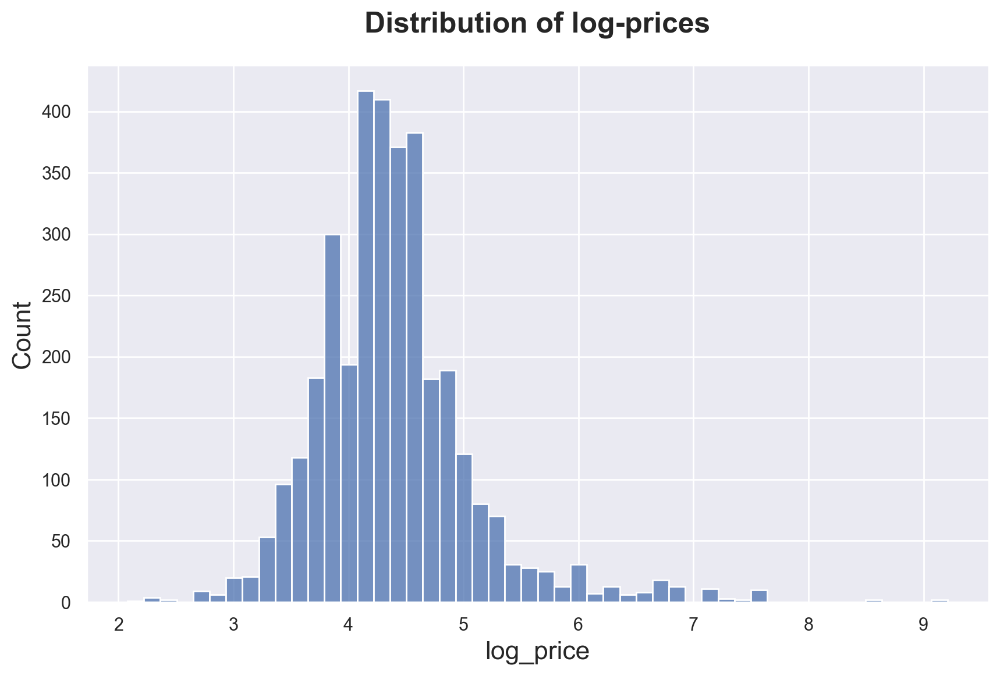

In [77]:
# criando um histograma da variável log_price usando a biblioteca Seaborn (sns), com 50 bins e um título personalizado.
sns.histplot(df_listings['log_price'], bins=50).set(title='Distribution of log-prices')

* Vamos adicionar um estimador de densidade kernel (KDE - Kernel Density Estimation) para visualizar a distribuição dos dados de forma mais suave
  * KDE (Kernel Density Estimation) cria uma curva suave que aproxima a distribuição dos dados.
  * Ele ajuda a visualizar padrões e tendências sem a segmentação brusca dos bins do histograma.

[Text(0.5, 1.0, 'Distribution of log-prices with density')]

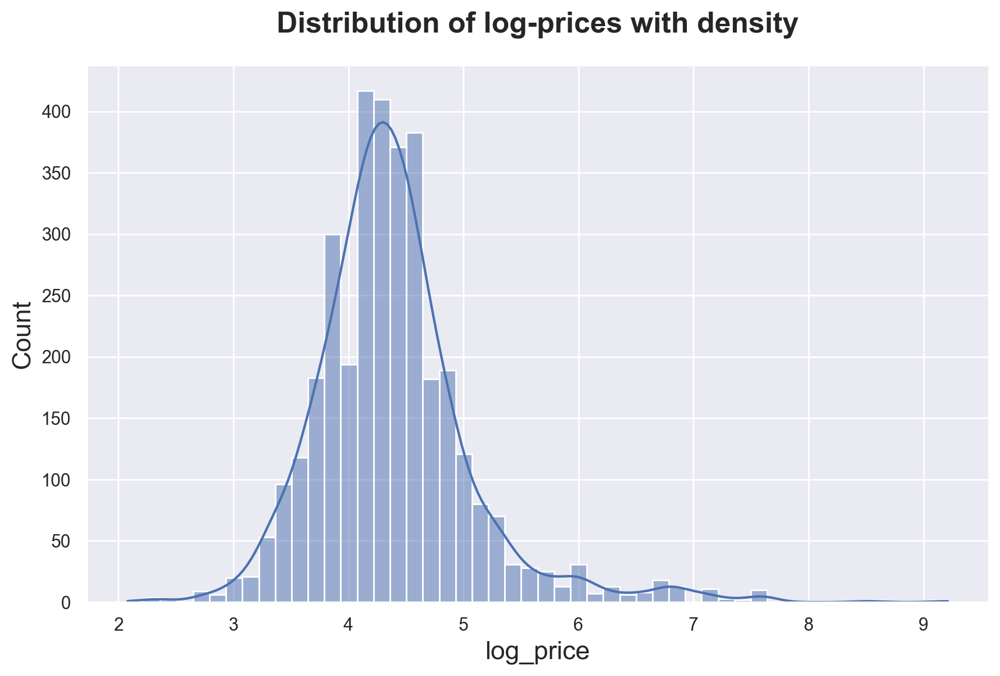

In [79]:
sns.histplot(df_listings['log_price'], bins=50, kde=True).set(title='Distribution of log-prices with density')

Vamos um gráfico de contagem (bar plot) que exibe a quantidade de observações (anúncios) em cada bairro (neighborhood) do DataFrame df_listings.

[Text(0.5, 1.0, 'Number of observations by neighborhood')]

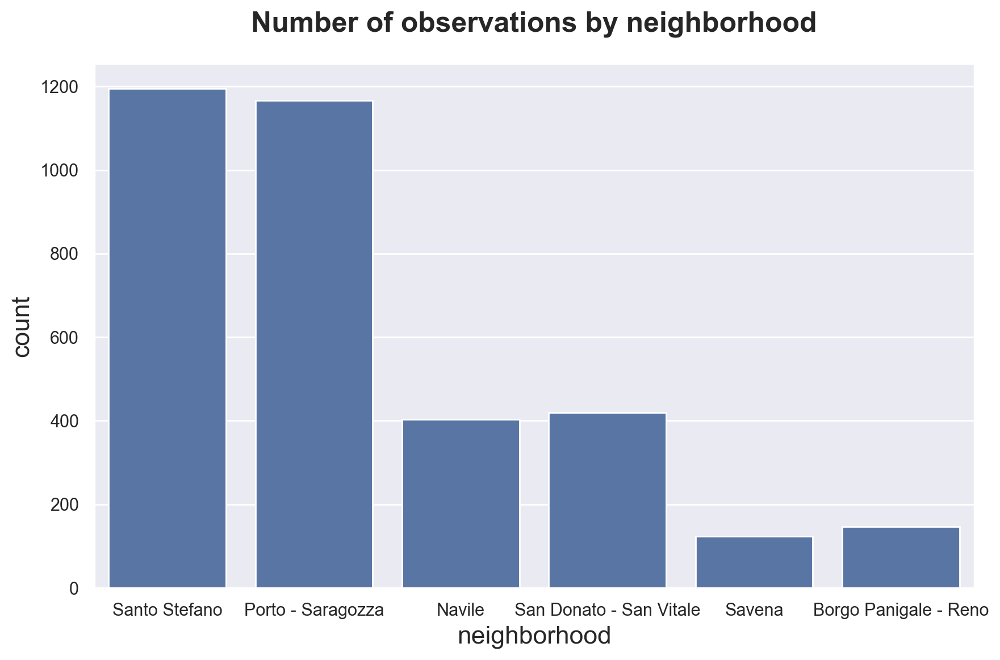

In [81]:
sns.countplot(x="neighborhood", data=df_listings).set(title='Number of observations by neighborhood')

Se, em vez disso, quisermos ver a distribuição de outra variável em algum grupo, podemos usar a função sns.barplot().

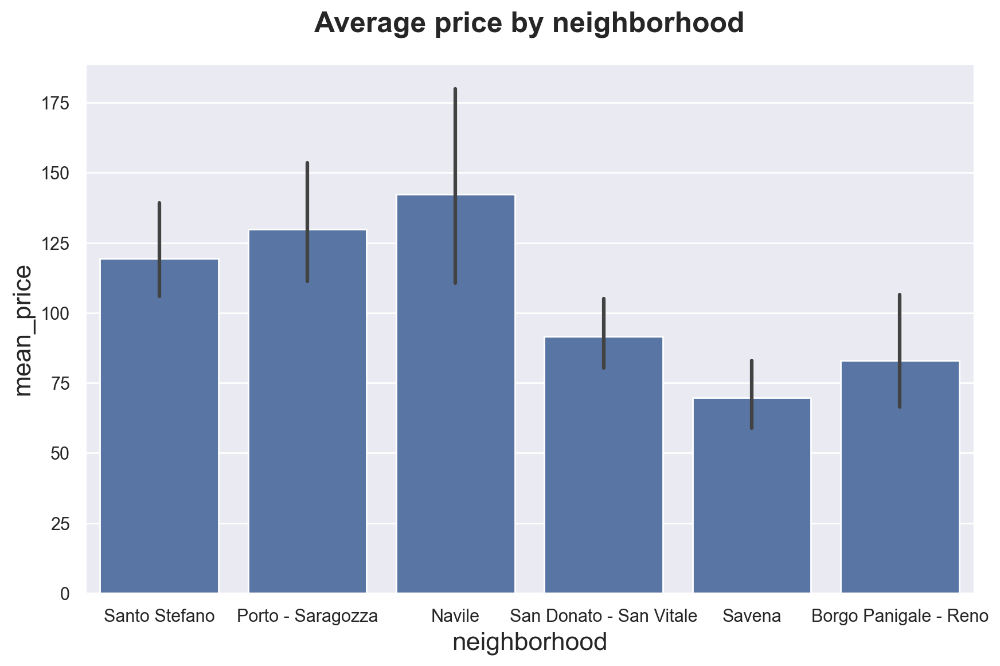

In [ ]:
sns.barplot(x="neighborhood", y="mean_price", data=df_listings).set(title='Average price by neighborhood')

[Text(0.5, 1.0, 'Median price by neighborhood')]

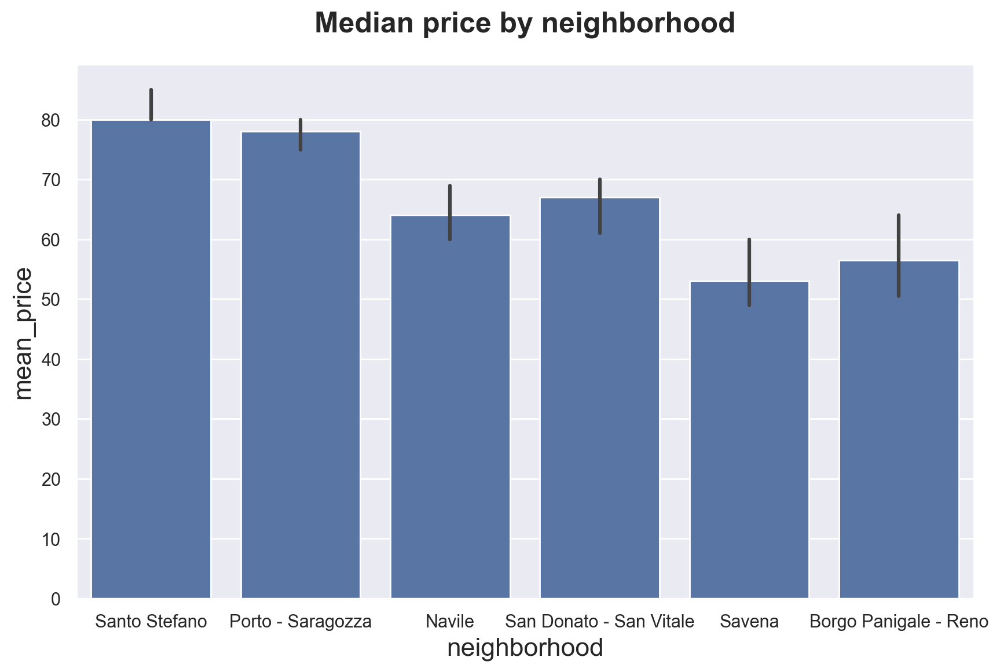

In [82]:
sns.barplot(x="neighborhood", y="mean_price", data=df_listings, estimator=np.median).set(title='Median price by neighborhood')

[Text(0.5, 1.0, 'Price distribution across neighborhoods')]

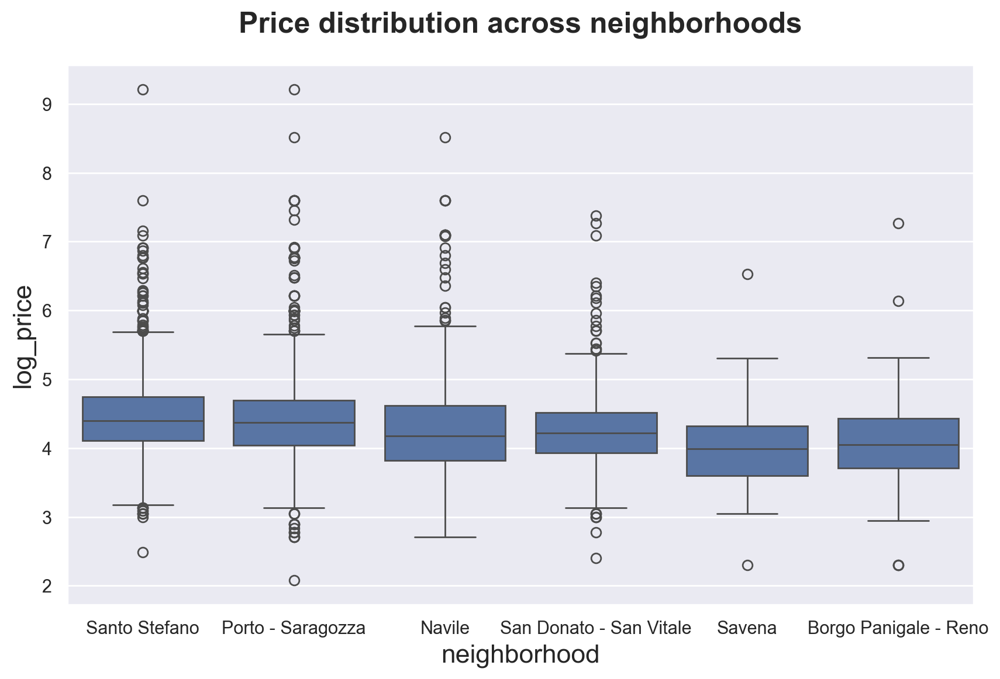

In [83]:
sns.boxplot(x="neighborhood", y="log_price", data=df_listings).set(title='Price distribution across neighborhoods')

[Text(0.5, 1.0, 'Price distribution across neighborhoods')]

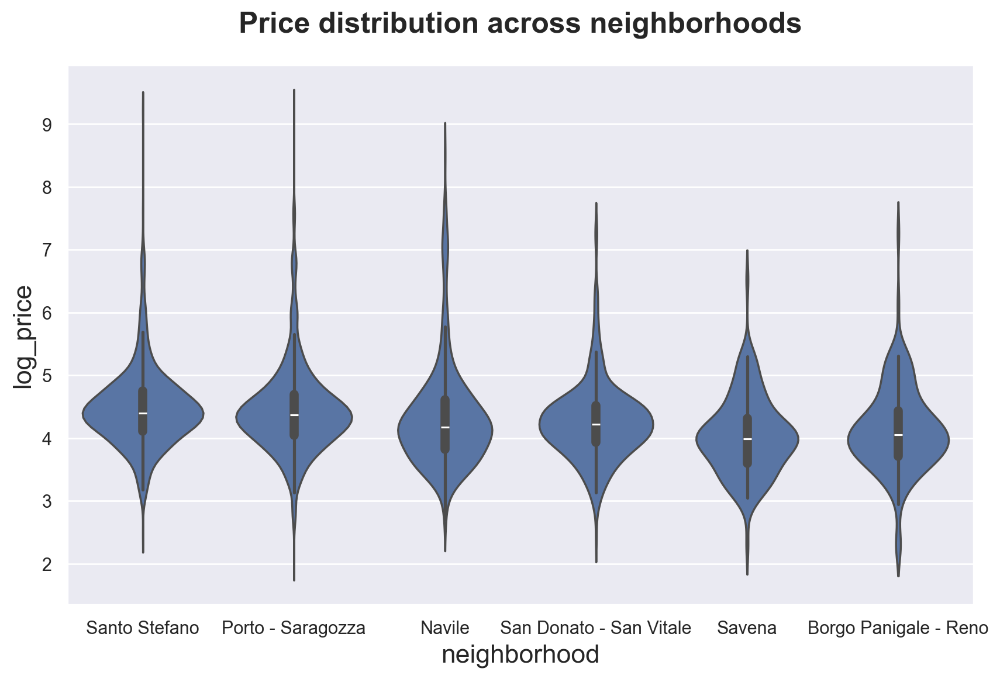

In [84]:
sns.violinplot(x="neighborhood", y="log_price", data=df_listings).set(title='Price distribution across neighborhoods')

[Text(0.5, 1.0, 'Price distribution over time')]

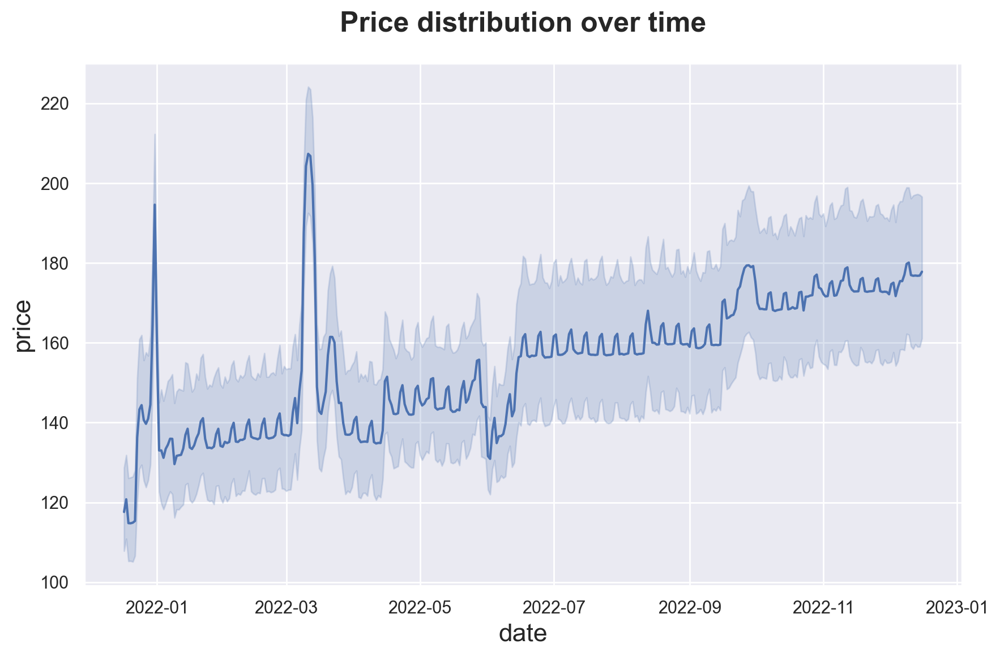

In [85]:
sns.lineplot(data=df, x='date', y='price').set(title="Price distribution over time")

[Text(0.5, 1.0, 'Price distribution over time')]

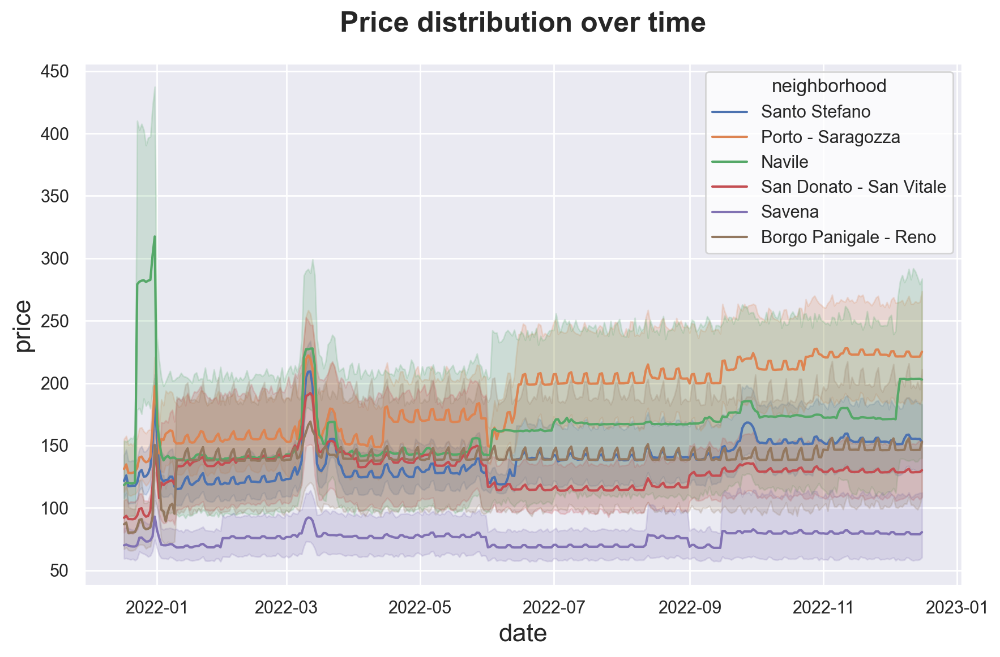

In [86]:
sns.lineplot(data=df, x='date', y='price', hue='neighborhood').set(title="Price distribution over time")

In [87]:
df_listings["log_reviews"] = np.log(1 + df_listings["number_of_reviews"])
df_listings["log_rpm"] = np.log(1 + df_listings["reviews_per_month"])

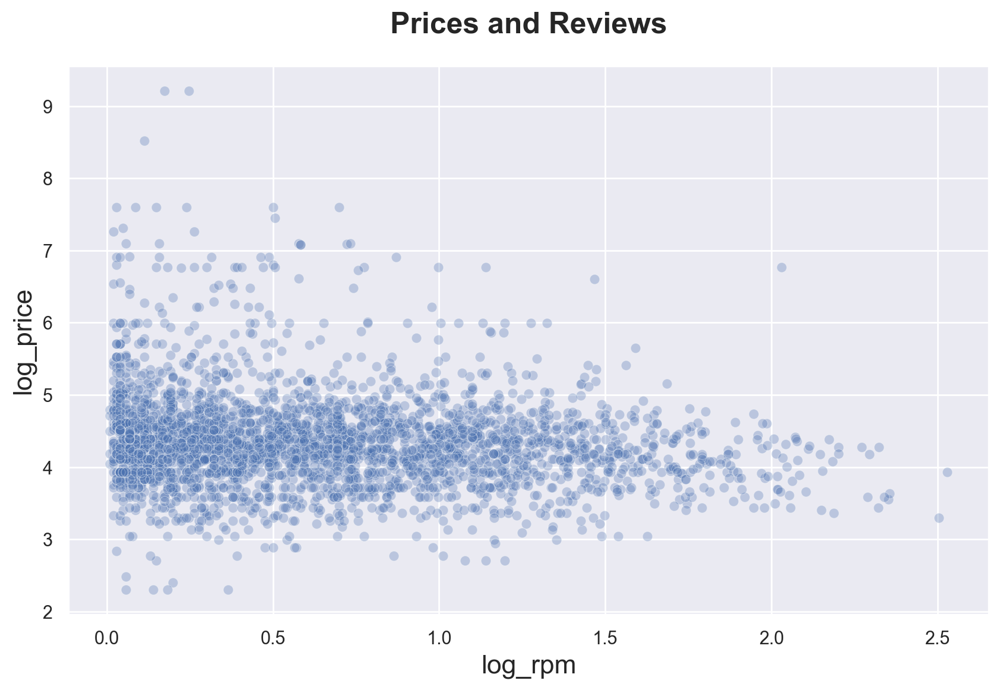

In [88]:
sns.scatterplot(data=df_listings, x="log_rpm", y="log_price", alpha=0.3).set(title='Prices and Reviews');

[Text(0.5, 1.0, 'Price and Reviews')]

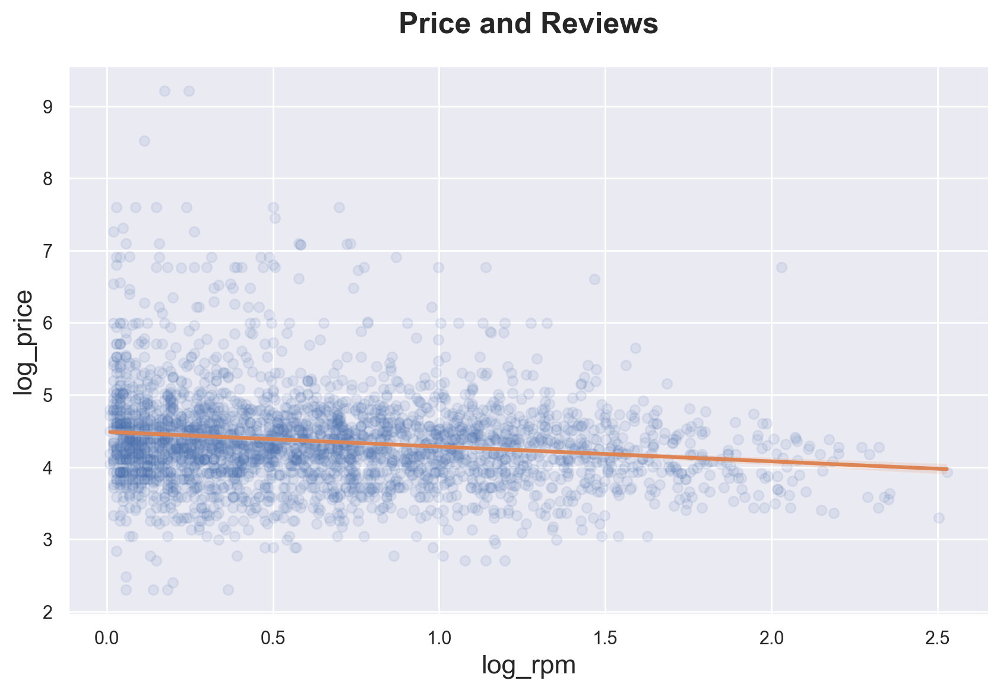

In [89]:
sns.regplot(x="log_rpm", y="log_price", data=df_listings, scatter_kws={'alpha':.1}, line_kws={'color':'C1'}).set(title='Price and Reviews')

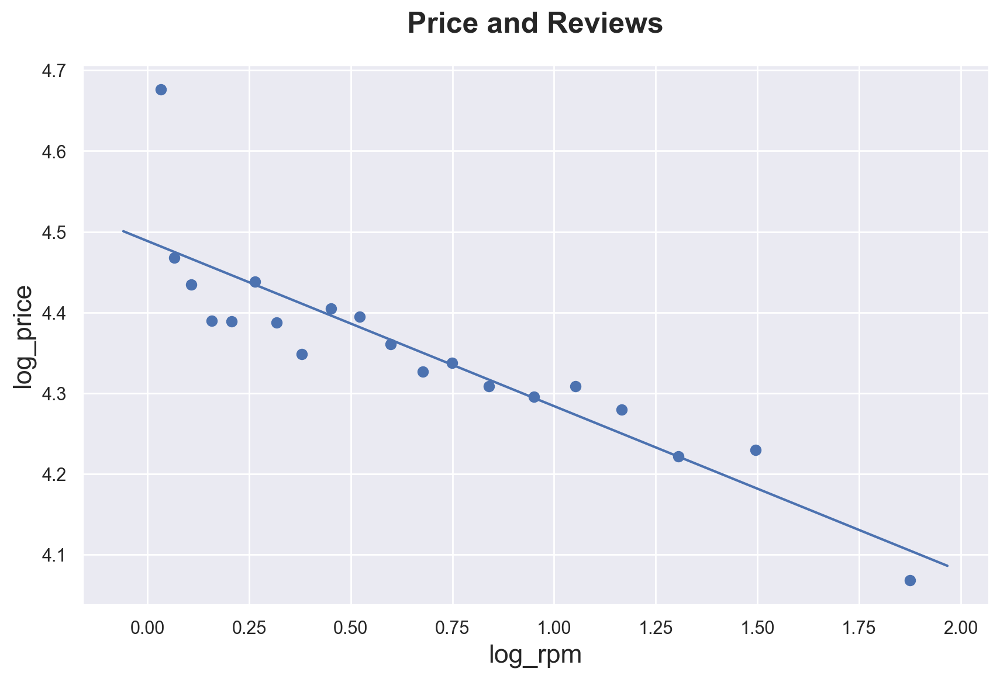

In [90]:
import binscatter

# Remove nans
temp = df_listings[["log_rpm", "log_price"]].dropna()

# Binned scatter plot of Wage vs Tenure
fig, ax = plt.subplots()
ax.binscatter(temp["log_rpm"], temp["log_price"]);
ax.set_title('Price and Reviews');

[Text(0.5, 1.0, 'Prices and Ratings, by room type')]

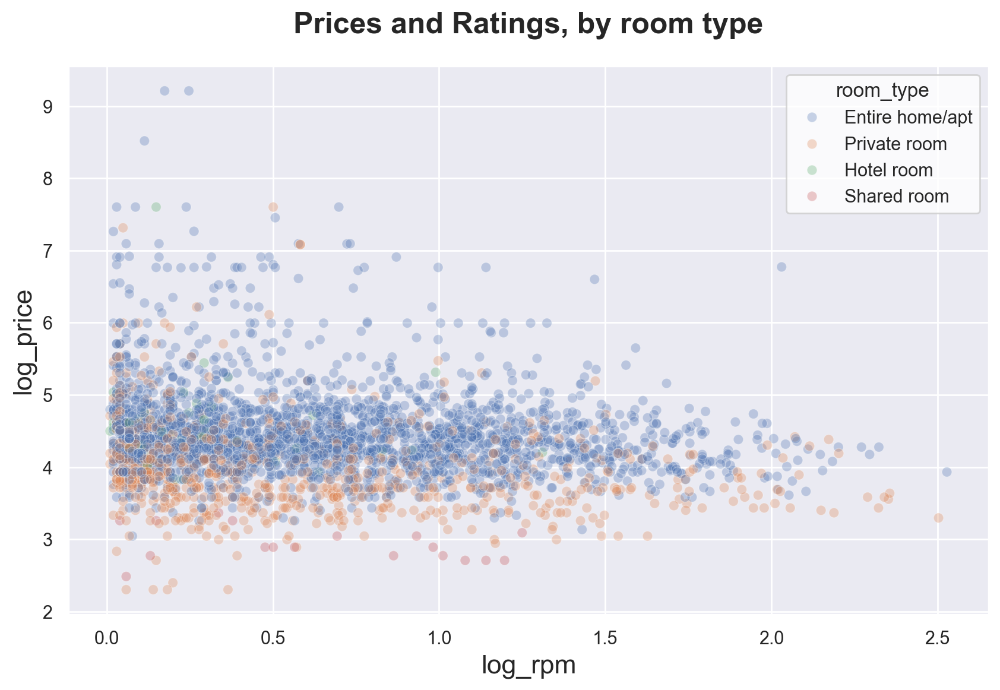

In [91]:
sns.scatterplot(data=df_listings, x="log_rpm", y="log_price", hue="room_type", alpha=0.3).set(title="Prices and Ratings, by room type")

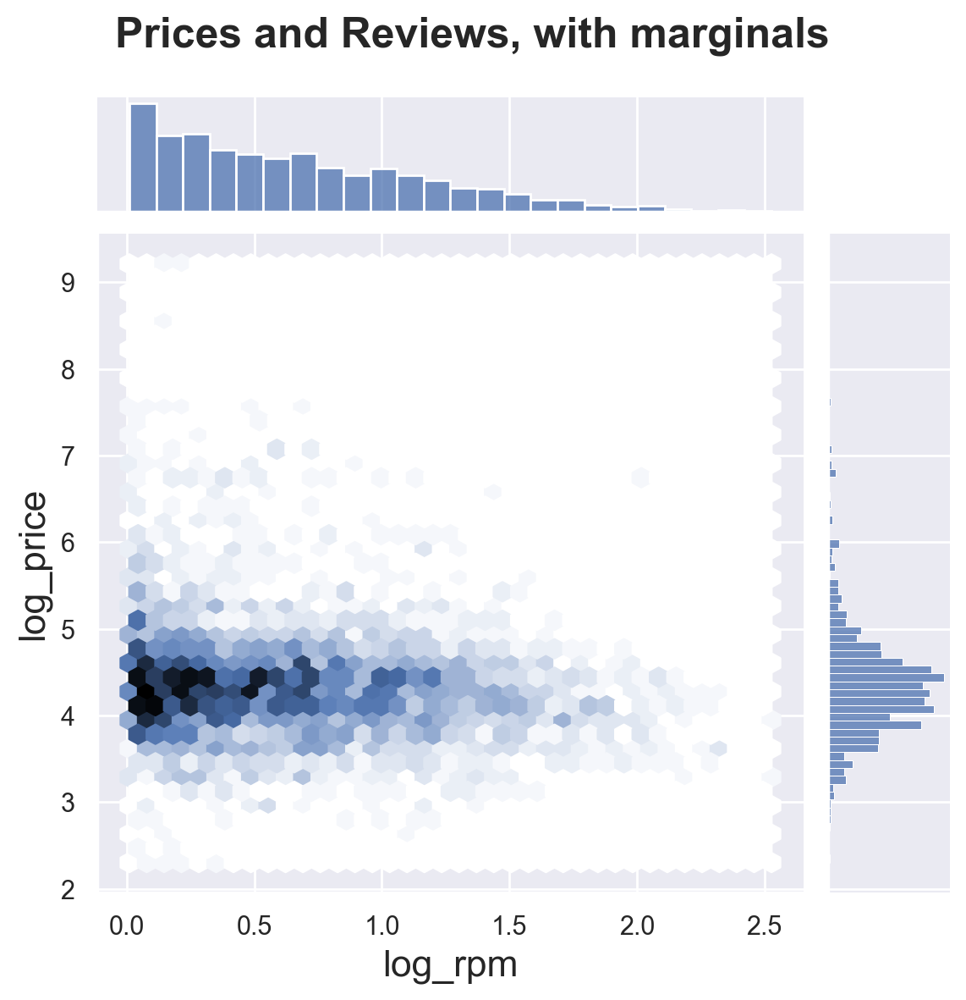

In [92]:
sns.jointplot(data=df_listings, x="log_rpm", y="log_price", kind="hex").fig.suptitle("Prices and Reviews, with marginals")
plt.subplots_adjust(top=0.9);

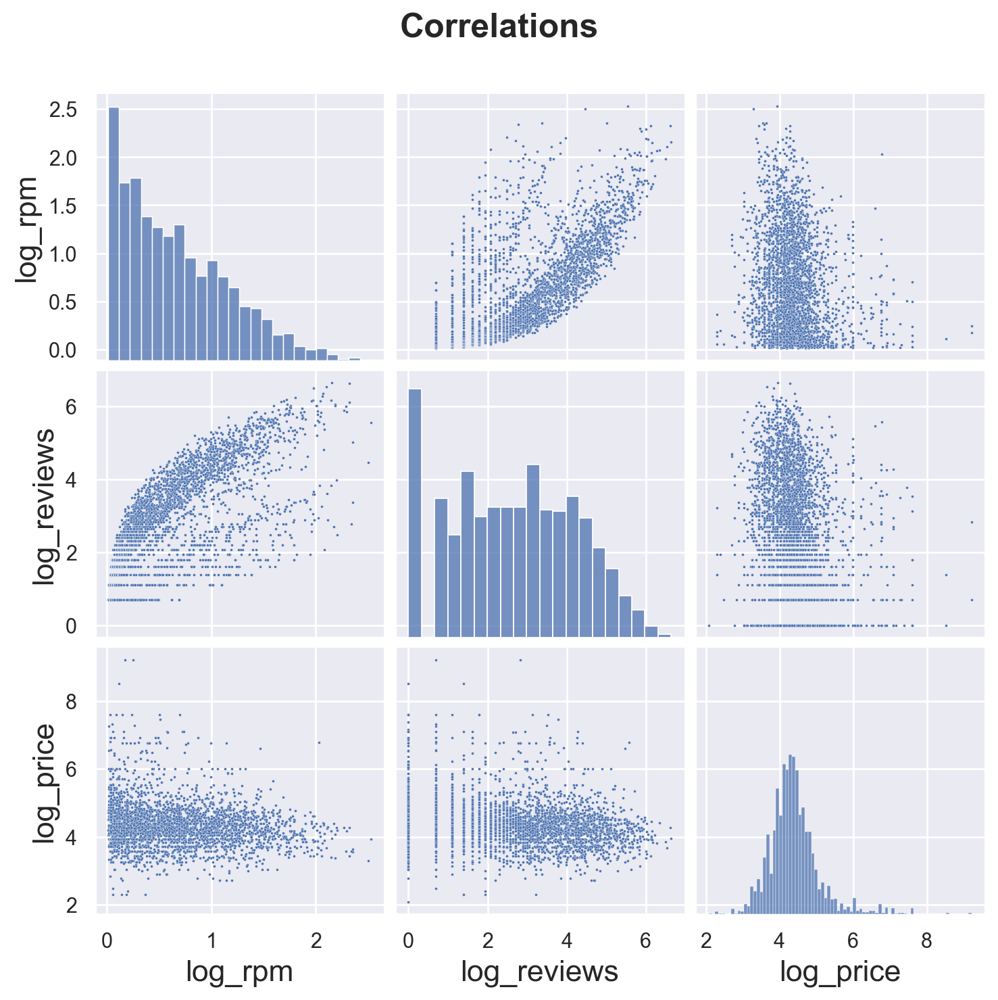

In [93]:
sns.pairplot(data=df_listings, vars=["log_rpm", "log_reviews", "log_price"], plot_kws={'s':2}).fig.suptitle("Correlations")
plt.subplots_adjust(top=0.9)

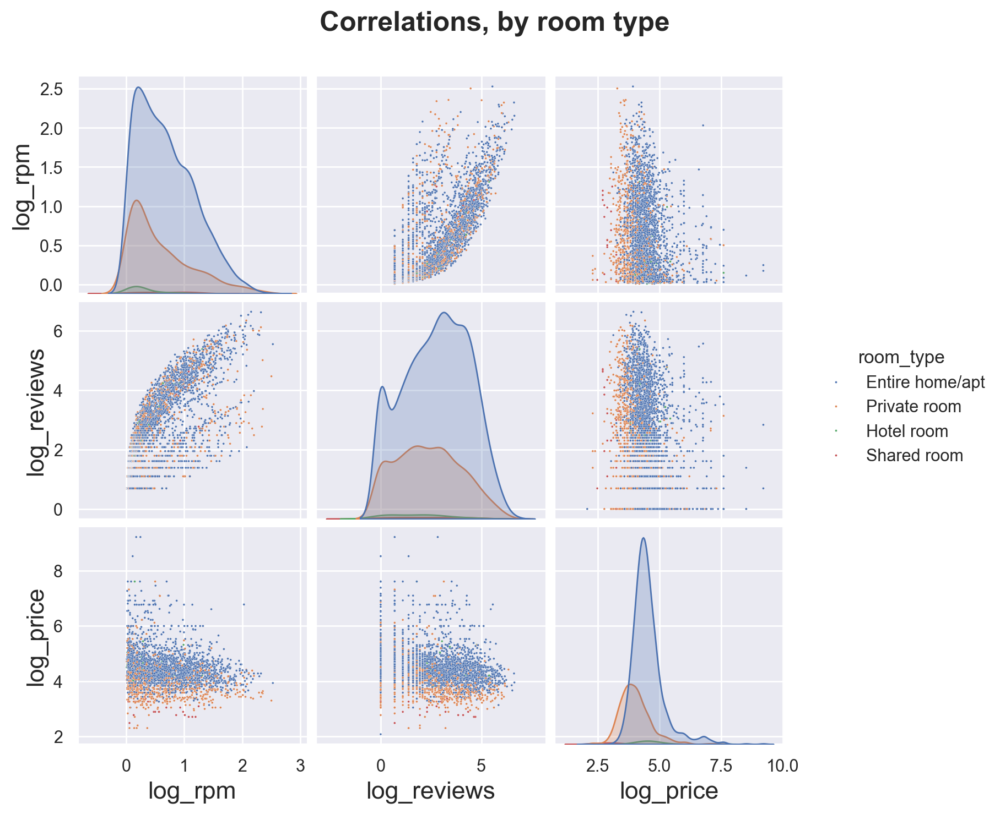

In [94]:
sns.pairplot(data=df_listings, vars=["log_rpm", "log_reviews", "log_price"], hue='room_type', plot_kws={'s':2}).fig.suptitle("Correlations, by room type")
plt.subplots_adjust(top=0.9)

C:\Users\danie\AppData\Local\Temp\ipykernel_5288\339058863.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), vmin=-1, vmax=1, linewidths=.5, cmap="RdBu").set(title="Correlations")


[Text(0.5, 1.0, 'Correlations')]

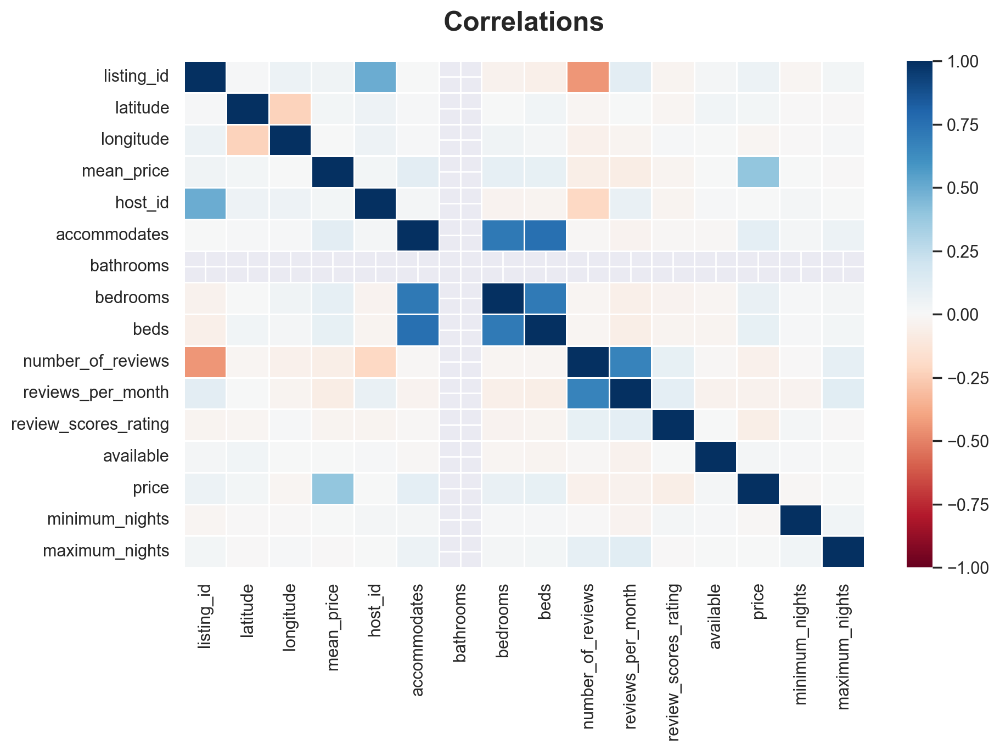

In [95]:
# Plot
sns.heatmap(df.corr(), vmin=-1, vmax=1, linewidths=.5, cmap="RdBu").set(title="Correlations")

[Text(0.5, 1.0, 'Listing coordinates')]

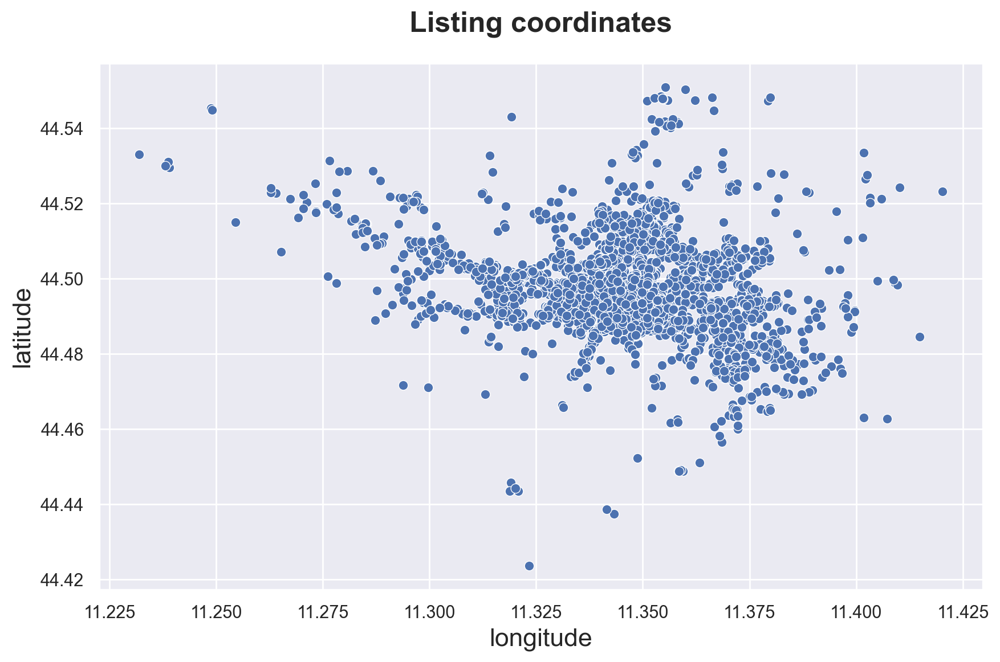

In [96]:
sns.scatterplot(data=df_listings, x="longitude", y="latitude").set(title='Listing coordinates')

In [97]:
import geopandas

geom = geopandas.points_from_xy(df_listings.longitude, df_listings.latitude)
gdf = geopandas.GeoDataFrame(df_listings, geometry=geom, crs=4326).to_crs(3857)

<Axes: title={'center': 'Bologna, Emilia-Romagna, Italia'}, xlabel='X', ylabel='Y'>

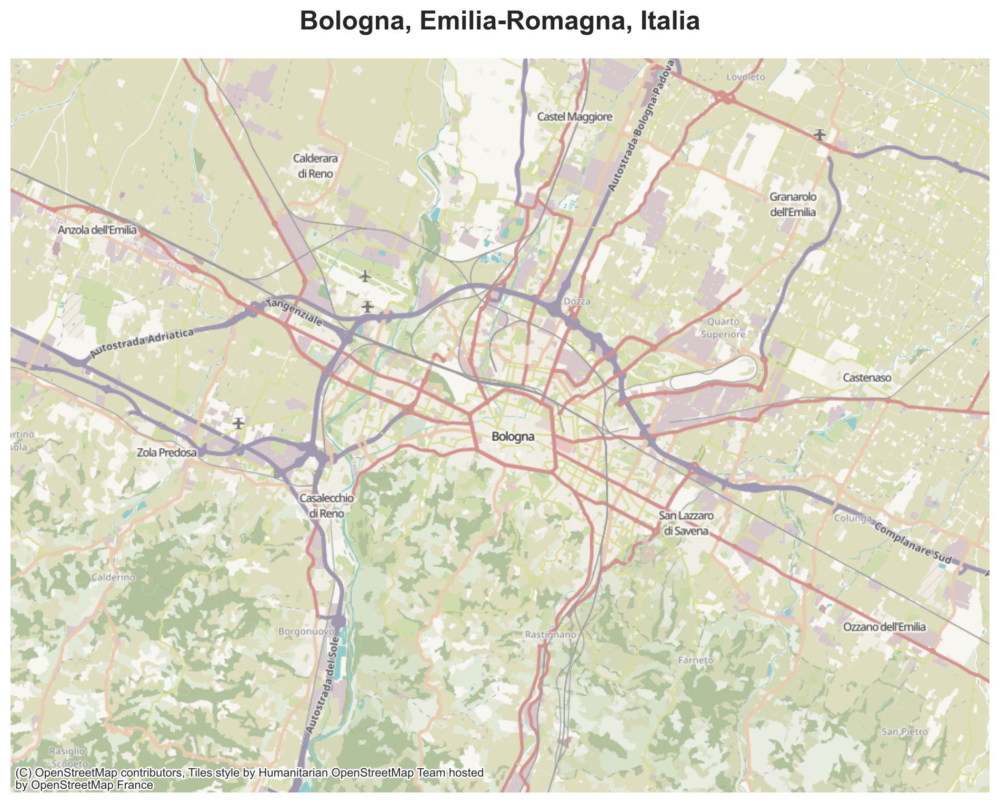

In [98]:
import contextily as cx
# Buscar por Bologna e exibe o mapa
bologna = cx.Place("Bologna")
bologna.plot()

<Axes: title={'center': 'Bologna, Emilia-Romagna, Italia'}, xlabel='X', ylabel='Y'>

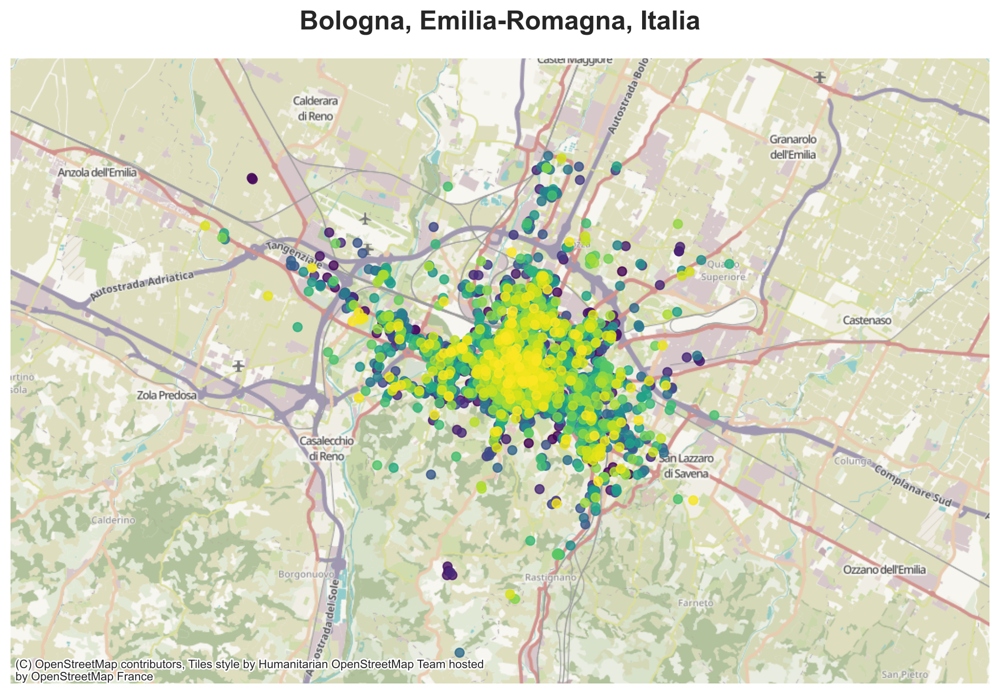

In [99]:
ax = bologna.plot()
ax.set_ylim([5530000, 5555000])
gdf.plot(ax=ax, c=df_listings['mean_price'], cmap='viridis', alpha=0.8)